In [31]:
import os
import time
import random
import copy

import timm
import torch
import pandas as pd
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
from albumentations.pytorch import ToTensorV2
import albumentations as A
from albumentations import ImageOnlyTransform
from augraphy import *
from torch.optim import Adam
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader, ConcatDataset

from PIL import Image
from tqdm import tqdm
from sklearn.metrics import accuracy_score, f1_score

import matplotlib.pyplot as plt

pre_path = '/kkh/'
train_kr_aug_image_path = pre_path + 'data/train_kr_aug'
meta_kr_csv_path = pre_path + 'data/meta_kr.csv'
train_kr_csv_path = pre_path + 'data/train_kr.csv'
train_kr_aug_csv_path = pre_path + 'data/train_kr_aug.csv'
meta_kr_df = pd.read_csv(meta_kr_csv_path)
train_kr_df = pd.read_csv(train_kr_csv_path)
train_kr_aug_df = pd.read_csv(train_kr_aug_csv_path)

In [32]:
# 시드를 고정합니다.
SEED = 42
os.environ['PYTHONHASHSEED'] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.benchmark = True

In [33]:
# 데이터셋 클래스를 정의합니다.
class ImageDataset(Dataset):
    def __init__(self, csv, path, transform=None, oversample=False):
        self.df = pd.read_csv(csv)
        self.path = path
        self.transform = transform
        self.oversample = oversample

        # 클래스간 불균형 해소를 위한 샘플 증식
        if self.oversample:
            # 각 클래스별로 데이터 수 계산
            class_counts = np.bincount(self.df.values[:, 1].astype(int))

            # 각 클래스별로 증식할 횟수 설정 (이 예제에서는 최대 데이터 수에 맞춤)
            max_class_count = max(class_counts)
            oversample_factors = [max_class_count // count for count in class_counts]
            # Class 3, 7 가중치 2로 변경
            oversample_factors[3] = 2
            oversample_factors[7] = 2 
            # oversample_factors[14] = 3 

            # 각 클래스별로 데이터를 증식한 새로운 데이터 프레임 생성
            oversampled_data = [self.df.values[self.df.values[:, 1] == cls].repeat(factor, axis=0) for cls, factor in enumerate(oversample_factors)]
            oversampled_data = np.vstack(oversampled_data)

            self.df = pd.DataFrame(oversampled_data, columns=self.df.columns)

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        name, target = self.df.iloc[idx]
        img = np.array(Image.open(os.path.join(self.path, name)).convert("RGB"))
        
        if self.transform:
            img = self.transform(image=img)['image']
        return img, target
    
label_to_class_name = dict(zip(meta_kr_df['target'], meta_kr_df['class_name']))

In [34]:
# one epoch 학습을 위한 함수
def training(model, dataloader, criterion, optimizer, device, epoch, num_epochs):
    model.train()
    train_loss = 0
    preds_list = []
    targets_list = []

    pbar = tqdm(dataloader)
    for images, labels in pbar:
        images = images.to(device)
        labels = labels.to(device)

        model.zero_grad(set_to_none=True)

        preds = model(images)
        loss = criterion(preds, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        preds_list.extend(preds.argmax(dim=1).detach().cpu().numpy())
        targets_list.extend(labels.detach().cpu().numpy())

        pbar.set_description(f"Epoch [{epoch+1}/{num_epochs}] - Train Loss: {loss.item()}")
        
    train_loss /= len(dataloader)
    train_acc = accuracy_score(targets_list, preds_list)    
    train_f1 = f1_score(targets_list, preds_list, average='macro')

    return model, train_loss, train_acc, train_f1

def evaluation(model, dataloader, criterion, device, epoch, num_epochs):
    model.eval()  # 모델을 평가 모드로 설정
    valid_loss = 0.0
    preds_list = []
    targets_list = []

    with torch.no_grad(): # model의 업데이트 막기
        tbar = tqdm(dataloader)
        for images, labels in tbar:
            images = images.to(device)
            labels = labels.to(device)

            preds = model(images)
            loss = criterion(preds, labels)

            valid_loss += loss.item()
            preds_list.extend(preds.argmax(dim=1).detach().cpu().numpy())
            targets_list.extend(labels.detach().cpu().numpy())

            tbar.set_description(f"Epoch [{epoch+1}/{num_epochs}] - Valid Loss: {loss.item()}")

    valid_loss = valid_loss / len(dataloader)
    valid_acc = accuracy_score(targets_list, preds_list)  
    valid_f1 = f1_score(targets_list, preds_list, average='macro')

    return valid_loss, valid_acc, valid_f1

def training_loop(model, train_dataloader, valid_dataloader, criterion, optimizer, device, num_epochs, patience, model_name):
    best_valid_loss = float('inf')  # 가장 좋은 validation loss를 저장
    early_stop_counter = 0  # 카운터
    valid_max_accuracy = -1
    best_model = None

    for epoch in range(num_epochs):
        model, train_loss, train_acc, train_f1 = training(model, train_dataloader, criterion, optimizer, device, epoch, num_epochs)
        valid_loss, valid_acc, valid_f1 = evaluation(model, valid_dataloader, criterion, device, epoch, num_epochs)

        monitoring_value = {'train_loss': train_loss, 'train_accuracy': train_acc, 'train_f1': train_f1, 
                            'valid_loss': valid_loss, 'valid_accuracy': valid_acc, 'valid_f1': valid_f1}
        
        print(f'''Epoch [{epoch + 1}/{num_epochs}] Finished
        Train Loss: {train_loss}, Train Accuracy: {train_acc}, Train F1: {train_f1}
        Valid Loss: {valid_loss}, Valid Accuracy: {valid_acc}, Valid F1: {valid_f1}''')

        if valid_acc > valid_max_accuracy:
          valid_max_accuracy = valid_acc

        # validation loss가 감소하면 모델 저장 및 카운터 리셋
        if valid_loss < best_valid_loss:
            best_valid_loss = valid_loss
            best_model = model
            torch.save(model.state_dict(), f"./model_{model_name}.pt")
            early_stop_counter = 0
            print('Model Saved')

        # validation loss가 증가하거나 같으면 카운터 증가
        else:
            early_stop_counter += 1

        # 조기 종료 카운터가 설정한 patience를 초과하면 학습 종료
        if early_stop_counter >= patience:
            print("Early stopping")
            break

    return best_model, valid_max_accuracy

In [35]:
# 이미지 plotting을 위한 함수
def normalize_image(image):
    # 이미지를 [0, 1] 범위로 정규화
    image_min = image.min()
    image_max = image.max()
    normalized_image = (image - image_min) / (image_max - image_min)
    return normalized_image

def plot_images(images, labels, classes, normalize = True):

    n_images = len(images)
    
    num_rows = n_images // 3  # 행의 개수 계산
    if n_images % 3 != 0:
        num_rows += 1    
    fig, axes = plt.subplots(num_rows, 3, figsize=(30, 10 * num_rows))

    for i in range(n_images):
        image = images[i]
        label = classes[labels[i]]
        row_idx = i // 3
        col_idx = i % 3
        
        if normalize:
            image = normalize_image(image)
        
        axes[row_idx, col_idx].imshow(image.permute(1, 2, 0))
        axes[row_idx, col_idx].set_title(label)
        axes[row_idx, col_idx].axis('off')

    plt.show()

In [36]:
# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# validation config
VALID_RATIO = 0.8

# model config
model_name = 'efficientnet_b4'
pretrained_size = 380
pretrained_means = [0.485, 0.456, 0.406]
pretrained_stds= [0.229, 0.224, 0.225]

# training config
LR = 5e-4
BATCH_SIZE = 32
dropout_ratio = 0.2
patience = 5
num_workers = 0
num_classes = 17

In [37]:
# train image 변환을 위한 transform 코드
train_transform = A.Compose([
    # PatternGeneratorTransform(pattern, p=0.3), # 패턴 노이즈
    # A.Resize(height=pretrained_size, width=pretrained_size), # 이미지 크기 조정
    # 이미지 긴 측면 크기 조절 후 패딩 적용
    A.LongestMaxSize(max_size=pretrained_size, always_apply=True), 
    A.PadIfNeeded(min_height=pretrained_size, min_width=pretrained_size, border_mode=0, value=(255, 255, 255)),
    
    A.Normalize(mean=pretrained_means, std=pretrained_stds), # images normalization
    ToTensorV2() # numpy 이미지나 PIL 이미지를 PyTorch 텐서로 변환
])

# test image 변환을 위한 transform 코드
test_transform = A.Compose([    
    # A.Resize(height=pretrained_size, width=pretrained_size),
    A.LongestMaxSize(max_size=pretrained_size, always_apply=True),
    A.PadIfNeeded(min_height=pretrained_size, min_width=pretrained_size, border_mode=0, value=(255, 255, 255)),
    
    A.Normalize(mean=pretrained_means, std=pretrained_stds),
    ToTensorV2()
])

# aug_test_transform = A.Compose([    
#     A.RandomRotate90(),
#     A.Flip(p=0.5),              
                        
#     # A.Resize(height=pretrained_size, width=pretrained_size),
#     A.LongestMaxSize(max_size=pretrained_size, always_apply=True),
#     A.PadIfNeeded(min_height=pretrained_size, min_width=pretrained_size, border_mode=0, value=(255, 255, 255)),
    
#     A.Normalize(mean=pretrained_means, std=pretrained_stds),
#     ToTensorV2()
# ])

# 시각화를 위한 transform 코드
base_transform = A.Compose([
    ToTensorV2()
])

In [38]:
# Training Dataset 정의
train_dataset = ImageDataset(
    train_kr_aug_csv_path,
    train_kr_aug_image_path,
    transform=train_transform,
    oversample=True
)

# Test Dataset 정의
test_dataset = ImageDataset(
    pre_path + 'data/sample_submission.csv',
    pre_path + 'data/test/',
    transform=test_transform
)

# aug_test_dataset = ImageDataset(
#     data_path + 'sample_submission.csv',
#     data_path + 'test/',
#     transform=aug_test_transform
# )

# 시각화용 Dataset 정의
train_dataset_v = ImageDataset(
    train_kr_aug_csv_path,
    train_kr_aug_image_path,
    transform=base_transform
)

test_dataset_v = ImageDataset(
    pre_path + 'data/sample_submission.csv',
    pre_path + 'data/test/',
    transform=base_transform
)

print(len(train_dataset), len(test_dataset))

14928 3140


In [39]:
# 데이터 셋을 학습 데이터 셋과 검증 데이터 셋으로 분리
total_size = len(train_dataset)
train_num, valid_num = int(total_size * VALID_RATIO), total_size - int(total_size * VALID_RATIO)

# train - valid set 나누기
generator = torch.Generator().manual_seed(SEED)
train_dataset, valid_dataset = torch.utils.data.random_split(train_dataset, [train_num, valid_num], generator = generator)

valid_data = copy.deepcopy(valid_dataset)
valid_data.dataset.transform = test_transform

print(f'Train dataset 개수: {len(train_dataset)}')
print(f'Validation dataset 개수: {len(valid_dataset)}')
print(f'Test dataset 개수: {len(test_dataset)}')

Train dataset 개수: 11942
Validation dataset 개수: 2986
Test dataset 개수: 3140


In [40]:
# DataLoader 정의
train_dataloader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=num_workers,
    pin_memory=True,
    drop_last=False
    )

valid_dataloader = DataLoader(
    valid_dataset, 
    batch_size = BATCH_SIZE, 
    shuffle = False,
    num_workers=0,
    pin_memory=True
    )

test_dataloader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    pin_memory=True
    )

# aug_test_dataloader = DataLoader(
#     aug_test_dataset,
#     batch_size=BATCH_SIZE,
#     shuffle=False,
#     num_workers=0,
#     pin_memory=True
#     )

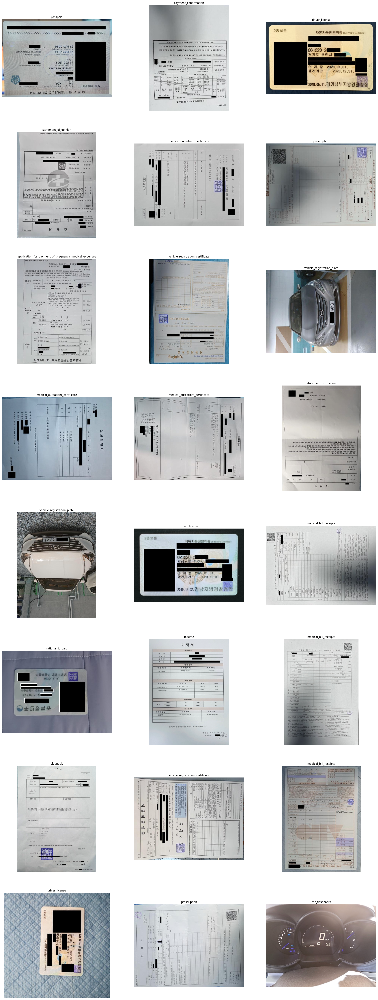

In [41]:
# 변환된 학습 이미지 확인
N_IMAGES = 24

# 무작위로 선택된 인덱스 리스트를 생성
selected_indices = random.sample(range(len(train_dataset_v)), N_IMAGES)

images, labels = zip(*[(image, label) for image, label in [train_dataset_v[i] for i in selected_indices]])
# images, labels = zip(*[(image, label) for image, label in [train_dataset_v[i] for i in range(N_IMAGES)]])

# plot_images(images, labels, label_to_class_name)

In [42]:
class AttentionModule(nn.Module):
    def __init__(self, in_features, out_features):
        super(AttentionModule, self).__init__()
        self.attention = nn.Sequential(
            nn.Linear(in_features, out_features),
            nn.Sigmoid()
        )

    def forward(self, x):
        attention_weights = self.attention(x)
        return x * attention_weights

class CustomEfficientNetB4(nn.Module):
    def __init__(self, num_classes, attention_size=1792):
        super(CustomEfficientNetB4, self).__init__()
        self.base_model = timm.create_model('efficientnet_b4', pretrained=True)
        
        # Remove the existing classifier
        self.base_model.reset_classifier(0, '')

        # Add attention mechanism
        self.attention = AttentionModule(attention_size, attention_size)

        # New classifier with attention
        self.classifier = nn.Linear(attention_size, num_classes)
        
    def forward(self, x):
        x = self.base_model(x)
        
        # Global average pooling
        x = x.mean([2, 3])

        # Apply attention mechanism
        x = self.attention(x)

        # Final classification
        x = self.classifier(x)

        return x

In [43]:
# 모델 생성
model = CustomEfficientNetB4(num_classes).to(device)
loss_fn = nn.CrossEntropyLoss()
optimizer = Adam(model.parameters(), lr=LR)

INFO:timm.models._builder:Loading pretrained weights from Hugging Face hub (timm/efficientnet_b4.ra2_in1k)
INFO:timm.models._hub:[timm/efficientnet_b4.ra2_in1k] Safe alternative available for 'pytorch_model.bin' (as 'model.safetensors'). Loading weights using safetensors.


In [44]:
EPOCHS = 50

# 모델 학습 루프 실행 및 검증 최대 정확도 출력
model, valid_max_accuracy = training_loop(
    model,             # 학습할 모델
    train_dataloader,  # 훈련 데이터로더
    valid_dataloader,  # 검증 데이터로더
    loss_fn,           # 손실 함수
    optimizer,         # 옵티마이저
    device,            # 디바이스 (CPU 또는 GPU)
    EPOCHS,            # 총 에폭 수
    patience,          # 조기 중단을 위한 인내 수
    model_name         # 모델 이름
)

# 검증 데이터에서의 최대 정확도 출력
print(f'Valid Max Accuracy: {valid_max_accuracy}')


Epoch [1/3] - Valid Loss: 0.002107176696881652: 100%|██████████| 94/94 [00:14<00:00,  6.51it/s] 


Epoch [1/3] Finished
        Train Loss: 0.37097000698110755, Train Accuracy: 0.8810082063305978, Train F1: 0.900112754635665
        Valid Loss: 0.024203500447254826, Valid Accuracy: 0.9949765572672472, Valid F1: 0.9963470474273377
Model Saved


Epoch [2/3] - Valid Loss: 2.4567783839302137e-05: 100%|██████████| 94/94 [00:14<00:00,  6.57it/s]


Epoch [2/3] Finished
        Train Loss: 0.028335758584351056, Train Accuracy: 0.9912912409981578, Train F1: 0.9934374774832258
        Valid Loss: 0.029067132791904905, Valid Accuracy: 0.9912926992632284, Valid F1: 0.9909214313107559


Epoch [3/3] - Valid Loss: 0.0005145176546648145: 100%|██████████| 94/94 [00:14<00:00,  6.71it/s] 

Epoch [3/3] Finished
        Train Loss: 0.021757860518535156, Train Accuracy: 0.9927147881426897, Train F1: 0.9937149128353004
        Valid Loss: 0.04087453969816821, Valid Accuracy: 0.9842598794373744, Valid F1: 0.986689861756435
Valid Max Accuracy: 0.9949765572672472


In [45]:
torch.cuda.empty_cache()

In [46]:
model.load_state_dict(torch.load(f'./model_{model_name}.pt'))
model.to(device)

N_TTA = 20
preds_list = []
with torch.no_grad():
    # loaders = [test_dataloader] + [aug_test_dataloader] * N_TTA
    loaders = [test_dataloader]

    for batches in tqdm(zip(*loaders), total=len(test_dataloader)):
        images, *aug_images = [images.to(device) for images, _ in batches]

        outputs_original = model(images)
        outputs_augmented = [model(aug_image) for aug_image in aug_images]

        final_outputs = (outputs_original + sum(outputs_augmented)) / N_TTA + 1
        preds_list.extend(final_outputs.argmax(dim=1).cpu().numpy())

# 예측 결과 확인
print("Ensemble Predictions:", preds_list)

100%|██████████| 99/99 [00:16<00:00,  5.99it/s]

Ensemble Predictions: [2, 12, 5, 13, 2, 13, 0, 8, 13, 11, 5, 7, 16, 9, 13, 13, 13, 5, 13, 13, 12, 12, 1, 13, 3, 0, 7, 16, 0, 13, 3, 0, 13, 2, 13, 16, 13, 14, 13, 0, 5, 9, 13, 9, 0, 8, 5, 0, 11, 14, 13, 10, 10, 13, 7, 12, 9, 5, 13, 13, 12, 13, 5, 5, 6, 3, 5, 13, 13, 6, 13, 10, 8, 15, 13, 13, 13, 12, 12, 13, 8, 9, 9, 13, 13, 10, 5, 13, 10, 0, 3, 8, 13, 15, 7, 16, 11, 11, 13, 13, 7, 4, 13, 0, 13, 11, 2, 13, 16, 8, 6, 2, 0, 13, 12, 16, 2, 7, 11, 7, 2, 13, 5, 8, 13, 13, 4, 4, 14, 6, 5, 13, 15, 13, 16, 16, 7, 6, 13, 8, 13, 8, 0, 2, 12, 8, 3, 9, 9, 8, 6, 8, 16, 12, 11, 16, 9, 15, 6, 8, 5, 5, 10, 13, 16, 13, 9, 12, 16, 5, 2, 8, 8, 16, 9, 13, 16, 16, 7, 4, 11, 15, 9, 9, 2, 7, 13, 10, 9, 0, 13, 0, 16, 5, 7, 13, 9, 13, 0, 13, 13, 2, 6, 16, 16, 13, 8, 9, 13, 10, 5, 13, 13, 7, 11, 2, 0, 3, 0, 13, 12, 13, 16, 13, 1, 5, 3, 0, 14, 6, 0, 13, 12, 13, 9, 13, 9, 10, 9, 13, 10, 14, 9, 13, 13, 0, 1, 11, 12, 6, 13, 0, 13, 4, 13, 15, 3, 12, 12, 4, 0, 15, 13, 12, 13, 12, 8, 3, 9, 0, 8, 3, 4, 5, 0, 0, 4, 0, 9, 

In [47]:
pred_df = pd.DataFrame(test_dataset.df, columns=['ID', 'target'])
pred_df['target'] = preds_list

sample_submission_df = pd.read_csv('/kkh/data/sample_submission.csv')
assert (sample_submission_df['ID'] == pred_df['ID']).all()

pred_df.to_csv("/kkh/submission/result_epc50.csv", index=False)